In [9]:
!pip install tensorflow

  Obtaining dependency information for tensorflow from https://files.pythonhosted.org/packages/e2/46/a26598fab7da99dbe3a564f90cb4bba8de9ceb8943ff9180cd9789b5f6ea/tensorflow-2.16.1-cp310-cp310-win_amd64.whl.metadata
  Using cached tensorflow-2.16.1-cp310-cp310-win_amd64.whl.metadata (3.5 kB)
  Obtaining dependency information for tensorflow-intel==2.16.1 from https://files.pythonhosted.org/packages/f1/32/05a56ab12d5601b5399e64b8f875362fb59c99218a5e74a99364a58516be/tensorflow_intel-2.16.1-cp310-cp310-win_amd64.whl.metadata
  Using cached tensorflow_intel-2.16.1-cp310-cp310-win_amd64.whl.metadata (5.0 kB)
  Obtaining dependency information for astunparse>=1.6.0 from https://files.pythonhosted.org/packages/2b/03/13dde6512ad7b4557eb792fbcf0c653af6076b81e5941d36ec61f7ce6028/astunparse-1.6.3-py2.py3-none-any.whl.metadata
  Using cached astunparse-1.6.3-py2.py3-none-any.whl.metadata (4.4 kB)
  Obtaining dependency information for gast!=0.5.0,!=0.5.1,!=0.5.2,>=0.2.1 from https://files.pythonhos


[notice] A new release of pip is available: 23.2.1 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


In [34]:
!pip install pydot


[notice] A new release of pip is available: 23.2.1 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


In [11]:
!pip install imblearn

  Obtaining dependency information for imblearn from https://files.pythonhosted.org/packages/81/a7/4179e6ebfd654bd0eac0b9c06125b8b4c96a9d0a8ff9e9507eb2a26d2d7e/imblearn-0.0-py2.py3-none-any.whl.metadata
  Obtaining dependency information for imbalanced-learn from https://files.pythonhosted.org/packages/6e/1b/66764ecf370e797759be06fb38c11640ea1f9456ae10f8640a33cfa726ea/imbalanced_learn-0.12.2-py3-none-any.whl.metadata
  Obtaining dependency information for numpy>=1.17.3 from https://files.pythonhosted.org/packages/b7/db/4d37359e2c9cf8bf071c08b8a6f7374648a5ab2e76e2e22e3b808f81d507/numpy-1.25.2-cp310-cp310-win_amd64.whl.metadata
  Using cached numpy-1.25.2-cp310-cp310-win_amd64.whl.metadata (5.7 kB)
   ---------------------------------------- 258.0/258.0 kB 5.3 MB/s eta 0:00:00
Using cached numpy-1.25.2-cp310-cp310-win_amd64.whl (15.6 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 1.26.4
    Uninstalling numpy-1.26.4:
      Successfully uninstalled numpy-1.26.4


ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
numba 0.57.1 requires numpy<1.25,>=1.21, but you have numpy 1.25.2 which is incompatible.

[notice] A new release of pip is available: 23.2.1 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


In [1]:
#Importing the libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import cv2
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import keras
from keras.callbacks import EarlyStopping,ModelCheckpoint
import tensorflow as tf
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from tqdm import tqdm
from imblearn.over_sampling import SMOTE
from keras.applications import EfficientNetB0

In [2]:
# Appending all the image path and its class from different subfolders test and train to a single df 
images = []
labels = []
for subfolder in tqdm(os.listdir('Alzheimer_s Dataset')):
    subfolder_path = os.path.join('Alzheimer_s Dataset', subfolder)
    for folder in os.listdir(subfolder_path):
        subfolder_path2=os.path.join(subfolder_path,folder)
        for image_filename in os.listdir(subfolder_path2):
            image_path = os.path.join(subfolder_path2, image_filename)
            images.append(image_path)
            labels.append(folder)
df = pd.DataFrame({'image': images, 'label': labels})
df

  0%|          | 0/2 [00:00<?, ?it/s]

100%|██████████| 2/2 [00:00<00:00, 60.60it/s]


,image,label
0,Alzheimer_s Dataset\test\MildDemented\26 (19).jpg,MildDemented
1,Alzheimer_s Dataset\test\MildDemented\26 (20).jpg,MildDemented
2,Alzheimer_s Dataset\test\MildDemented\26 (21).jpg,MildDemented
3,Alzheimer_s Dataset\test\MildDemented\26 (22).jpg,MildDemented
4,Alzheimer_s Dataset\test\MildDemented\26 (23).jpg,MildDemented
...,...,...
6395,Alzheimer_s Dataset\train\VeryMildDemented\ver...,VeryMildDemented
6396,Alzheimer_s Dataset\train\VeryMildDemented\ver...,VeryMildDemented
6397,Alzheimer_s Dataset\train\VeryMildDemented\ver...,VeryMildDemented
6398,Alzheimer_s Dataset\train\VeryMildDemented\ver...,VeryMildDemented


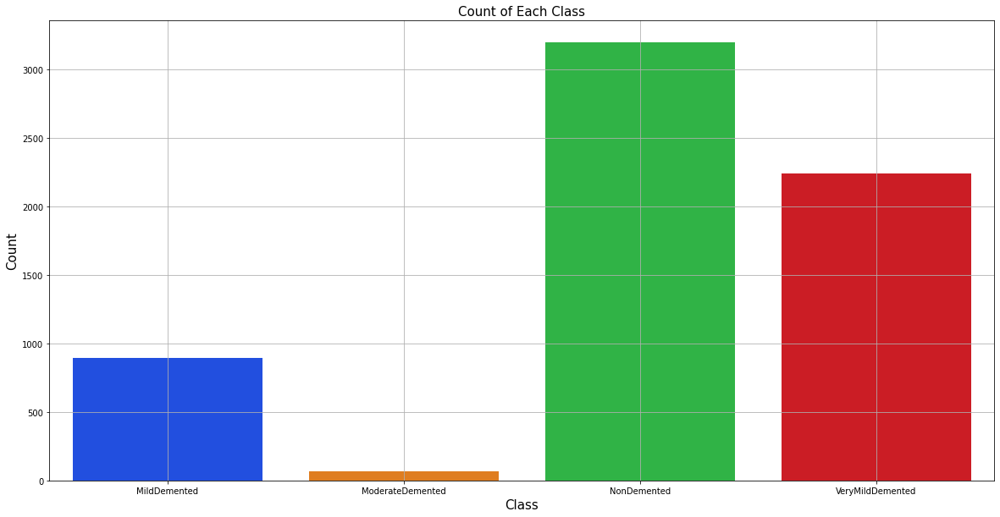

In [3]:
#plotting the barplot of count of different classes. here we see the dataset bein very imbalanced

plt.figure(figsize=(20,10))
ax = sns.countplot(x=df.label,palette='bright')
ax.set_xlabel("Class",fontsize=15)
ax.set_ylabel("Count",fontsize=15)
plt.title('Count of Each Class',fontsize=15)
plt.grid(True)
plt.show()

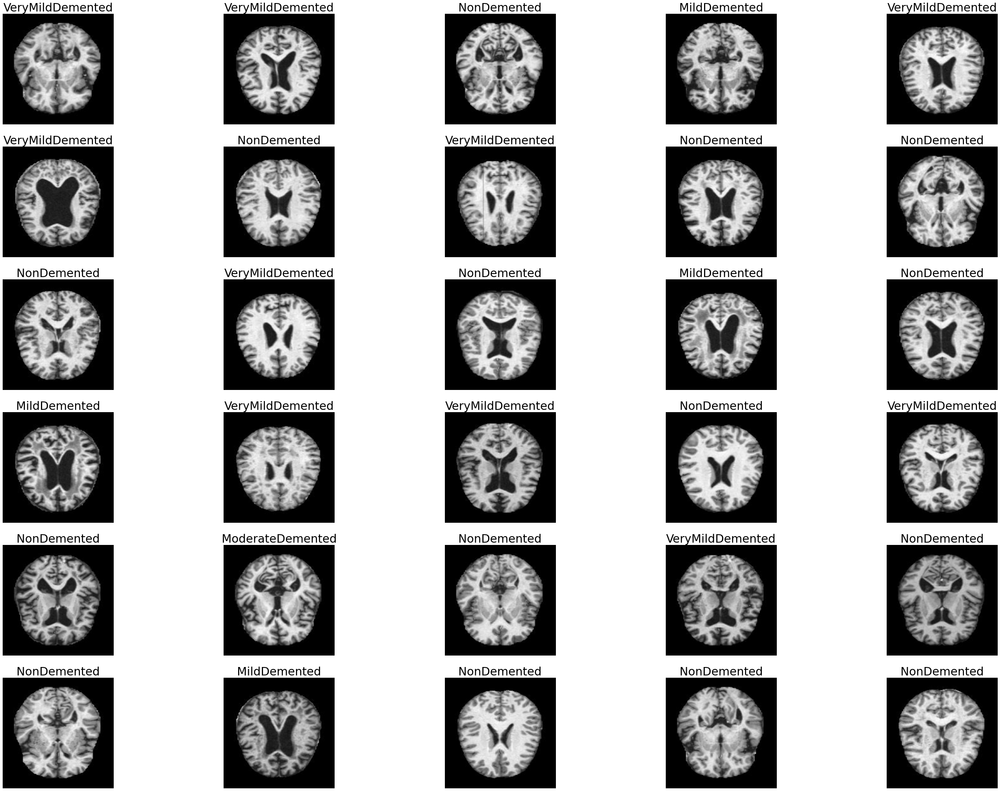

In [4]:
#Generating a grid of 30 randomly selected images with their labels. All the 4 cases are covered. Image difference between same classes can also be observed.
plt.figure(figsize=(50,50))
for x,i in enumerate(np.random.randint(0,len(df),30)):
    plt.subplot(8,5,x+1)
    img=cv2.imread(df.image[i])
    img=cv2.resize(img,(224,224))
    plt.imshow(img)
    plt.axis('off')
    plt.title(df.label[i],fontsize=30)

In [5]:
#Here we are preprocessing the image for SMOTE. firstly rescaling the image to 176x176 pixel. furthemore dividing each pixel by 255 to scale even further between 0 and 1. 
#After this all input features are within a scale. then appending them in a list.

# Define the ImageDataGenerator for preprocessing
Size=(176,176)
work_dr = ImageDataGenerator(rescale=1./255)

# Create the train_data_gen generator
train_data_gen = work_dr.flow_from_dataframe(df, x_col='image', y_col='label', target_size=Size, batch_size=6500, shuffle=False)

# Initialize empty lists for images and labels
images = []
labels = []

# Loop over train_data_gen to get data and labels
for i in range(len(train_data_gen)):
    train_data, train_labels = train_data_gen[i]
    images.append(train_data)
    labels.append(train_labels)

# Concatenate all images and labels
train_data = np.concatenate(images)
train_labels = np.concatenate(labels)

Found 6400 validated image filenames belonging to 4 classes.


In [6]:
# As the images and labels are imbalanced we will use SMOTE to balance them!! We will use the above list resample the dataset.
sm = SMOTE(random_state=42)

# Reshape the train_data to have the shape (n_samples, n_features)
train_data_flat = train_data.reshape(-1, 176 * 176 * 3)

# Perform SMOTE
train_data_resampled, train_labels_resampled = sm.fit_resample(train_data_flat, train_labels)

# Reshape the train_data back to the original shape
train_data_resampled = train_data_resampled.reshape(-1, 176, 176, 3)

print(train_data_resampled.shape, train_labels_resampled.shape)

(12800, 176, 176, 3) (12800, 4)


In [7]:
class_num=np.sort(['MildDemented','ModerateDemented','NonDemented','VeryMildDemented'])
class_num

array(['MildDemented', 'ModerateDemented', 'NonDemented',
       'VeryMildDemented'], dtype='<U16')

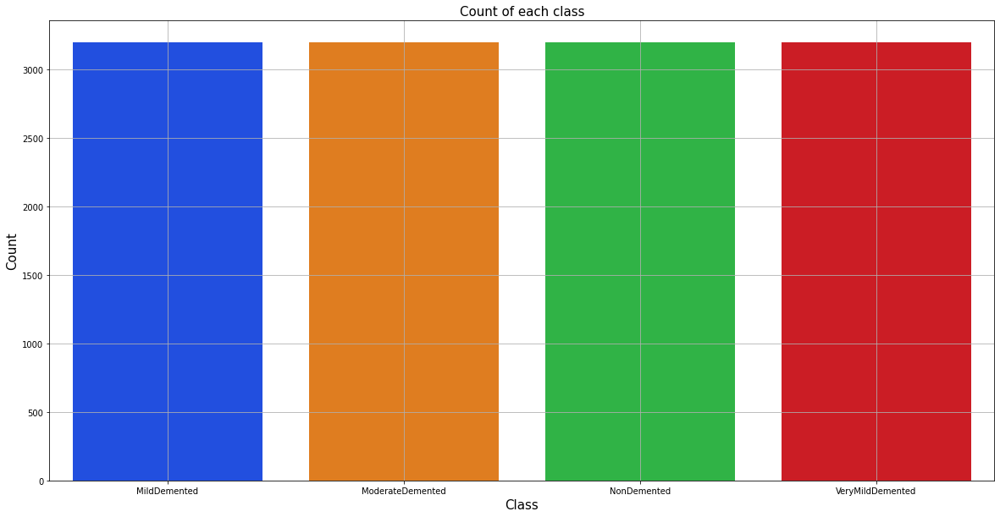

In [8]:
#now checking the count of each class through barplot
labels=[class_num[i] for i in np.argmax(train_labels_resampled,axis=1) ]
plt.figure(figsize=(20,10))
ax = sns.countplot(x=labels,palette='bright')
ax.set_xlabel("Class",fontsize=15)
ax.set_ylabel("Count",fontsize=15)
plt.title('Count of each class',fontsize=15)
plt.grid(True)
plt.show()

In [9]:
#Split dataset into test train validation.
X_train, X_test1, y_train, y_test1 = train_test_split(train_data_resampled,train_labels_resampled, test_size=0.3, random_state=42,shuffle=True,stratify=train_labels_resampled)
X_val, X_test, y_val, y_test = train_test_split(X_test1,y_test1, test_size=0.5, random_state=42,shuffle=True,stratify=y_test1)
print('X_train shape:' , X_train.shape)
print('X_test shape:' , X_test.shape)
print('X_val shape:' , X_val.shape)
print('y_train shape:' , y_train.shape)
print('y_test shape:' , y_test.shape)
print('y_val shape:' , y_val.shape)

X_train shape: (8960, 176, 176, 3)
X_test shape: (1920, 176, 176, 3)
X_val shape: (1920, 176, 176, 3)
y_train shape: (8960, 4)
y_test shape: (1920, 4)
y_val shape: (1920, 4)


In [10]:
#layers of the CNN
model=keras.models.Sequential()
model.add(keras.layers.Conv2D(32,kernel_size=(3,3),strides=2,padding='same',activation='relu',input_shape=(176,176,3)))
#model.add(keras.layers.MaxPool2D(pool_size=(2,2),strides=2,padding='same'))
model.add(keras.layers.Conv2D(64,kernel_size=(3,3),strides=2,activation='relu',padding='same'))
model.add(keras.layers.MaxPool2D((2,2),2,padding='same'))
model.add(keras.layers.Conv2D(128,kernel_size=(3,3),strides=2,activation='relu',padding='same'))
model.add(keras.layers.MaxPool2D((2,2),2,padding='same'))
model.add(keras.layers.Flatten())
model.add(keras.layers.Dense(1024,activation='relu'))
model.add(keras.layers.Dropout(0.3))
model.add(keras.layers.Dense(4,activation='softmax'))
model.summary()

c:\Users\Shaswat Sinha\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\layers\convolutional\base_conv.py:99: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 88, 88, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 44, 44, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 22, 22, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 11, 11, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 6, 6, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 4608)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1024)           │     4,719,616 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 4)              │         4,100 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,816,964 (18.38 MB)

 Trainable params: 4,816,964 (18.38 MB)

 Non-trainable params: 0 (0.00 B)

In [11]:
from keras.callbacks import ModelCheckpoint, EarlyStopping

In [12]:
#Training the model
checkpoint_cb =ModelCheckpoint("model.keras", save_best_only=True)
early_stopping_cb =EarlyStopping(patience=10, restore_best_weights=True)
model.compile(optimizer ='adam', loss='categorical_crossentropy', metrics=['accuracy'])
hist = model.fit(X_train,y_train, epochs=10, validation_data=(X_val,y_val), callbacks=[checkpoint_cb, early_stopping_cb])

Epoch 1/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - accuracy: 0.4506 - loss: 1.1151 - val_accuracy: 0.7286 - val_loss: 0.5978
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 29s 104ms/step - accuracy: 0.7716 - loss: 0.5064 - val_accuracy: 0.8250 - val_loss: 0.3839
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 29s 104ms/step - accuracy: 0.8919 - loss: 0.2534 - val_accuracy: 0.9234 - val_loss: 0.1691
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - accuracy: 0.9580 - loss: 0.1116 - val_accuracy: 0.9563 - val_loss: 0.1109
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 29s 105ms/step - accuracy: 0.9774 - loss: 0.0649 - val_accuracy: 0.9568 - val_loss: 0.1069
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 29s 105ms/step - accuracy: 0.9880 - loss: 0.0389 - val_accuracy: 0.9661 - val_loss: 0.1086
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - accuracy: 0.9919 - loss: 0.0239 - val_accuracy: 0.9161 - val_loss: 0.2285
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 29s 104ms/step - accuracy: 0.9813 - loss: 0

In [13]:
#accuracy loss for each epochs
history=pd.DataFrame(hist.history)
history

,accuracy,loss,val_accuracy,val_loss
0,0.585714,0.866253,0.728646,0.597840
1,0.801451,0.443160,0.825000,0.383859
2,0.902567,0.227232,0.923437,0.169149
3,0.956920,0.114032,0.956250,0.110879
4,0.973549,0.071644,0.956771,0.106871
5,0.985045,0.043897,0.966146,0.108635
6,0.988393,0.031483,0.916146,0.228531
7,0.985491,0.041594,0.978646,0.057626
8,0.993192,0.021097,0.975521,0.064609
9,0.990513,0.026555,0.973958,0.076102


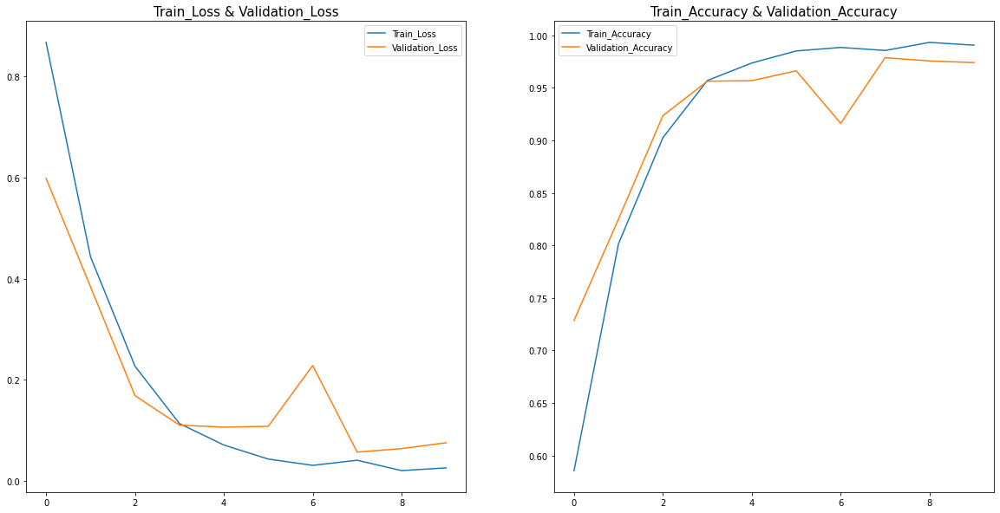

In [14]:
#training and validation loss and accuracy
plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
plt.plot(history['loss'],label='Train_Loss')
plt.plot(history['val_loss'],label='Validation_Loss')
plt.title('Train_Loss & Validation_Loss',fontsize=15)
plt.legend()
plt.subplot(1,2,2)
plt.plot(history['accuracy'],label='Train_Accuracy')
plt.plot(history['val_accuracy'],label='Validation_Accuracy')
plt.title('Train_Accuracy & Validation_Accuracy',fontsize=15)
plt.legend()
plt.show()

In [15]:
# test loss and test accuracy
score, acc= model.evaluate(X_test,y_test)
print('Test Loss =', score)
print('Test Accuracy =', acc)

60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - accuracy: 0.9826 - loss: 0.0483
Test Loss = 0.05518091470003128
Test Accuracy = 0.9807291626930237


In [16]:
#prediction test data
predictions = model.predict(X_test)
y_pred = np.argmax(predictions,axis=1)
y_test_ = np.argmax(y_test,axis=1)
df = pd.DataFrame({'Actual': y_test_, 'Prediction': y_pred})
df

60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step


,Actual,Prediction
0,1,1
1,1,1
2,0,0
3,2,2
4,2,2
...,...,...
1915,2,2
1916,0,0
1917,2,2
1918,3,3


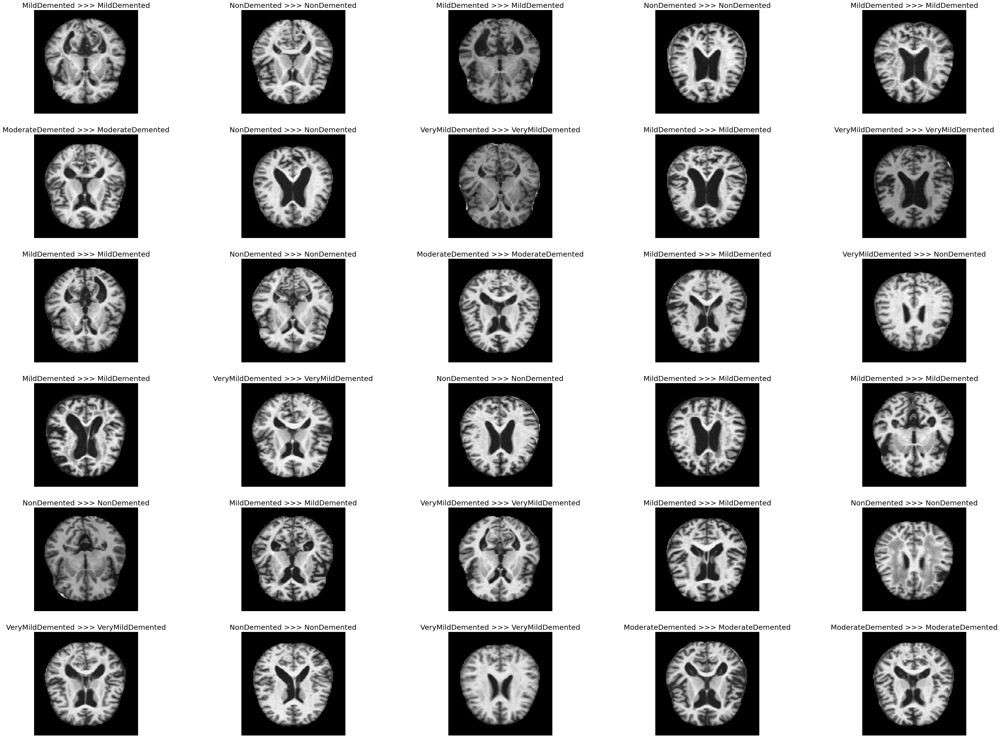

In [17]:
#images showing actual label and presicted label on a random 30 images.
plt.figure(figsize=(50,50))
for x,i in enumerate(np.random.randint(0,len(X_test),30)):
    plt.subplot(8,5,x+1)
    plt.imshow(X_test[i])
    plt.axis('off')
    plt.title(f'{class_num[y_test_[i]]} >>> {class_num[y_pred[i]]}',fontsize=20)

array([[478,   0,   1,   1],
       [  0, 480,   0,   0],
       [  1,   0, 471,   8],
       [  1,   0,  25, 454]], dtype=int64)

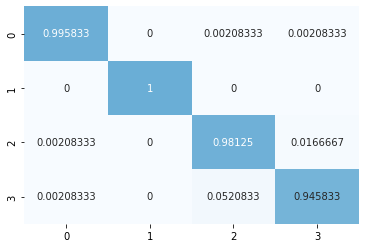

In [18]:
#confusion matrix
CM = confusion_matrix(y_test_,y_pred)
CM_percent = CM.astype('float') / CM.sum(axis=1)[:, np.newaxis]
sns.heatmap(CM_percent,fmt='g',center = True,cbar=False,annot=True,cmap='Blues')
CM

In [19]:
#classification report
ClassificationReport = classification_report(y_test_,y_pred)
print('Classification\nReport', ClassificationReport )

Classification
Report               precision    recall  f1-score   support

           0       1.00      1.00      1.00       480
           1       1.00      1.00      1.00       480
           2       0.95      0.98      0.96       480
           3       0.98      0.95      0.96       480

    accuracy                           0.98      1920
   macro avg       0.98      0.98      0.98      1920
weighted avg       0.98      0.98      0.98      1920



In [20]:
#MODEL 2 BASIC CNN
model=keras.models.Sequential()
model.add(keras.layers.Conv2D(32,kernel_size=(3,3),strides=2,padding='same',activation='relu',input_shape=(176,176,3)))
model.add(keras.layers.Conv2D(64,kernel_size=(3,3),strides=2,activation='relu',padding='same'))
model.add(keras.layers.MaxPool2D((2,2),2,padding='same'))
model.add(keras.layers.Flatten())
model.add(keras.layers.Dense(1024,activation='relu'))
model.add(keras.layers.Dense(4,activation='softmax'))
model.summary()

c:\Users\Shaswat Sinha\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\layers\convolutional\base_conv.py:99: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)               │ (None, 88, 88, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 44, 44, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 22, 22, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 30976)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1024)           │    31,720,448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 4)              │         4,100 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 31,743,940 (121.09 MB)

 Trainable params: 31,743,940 (121.09 MB)

 Non-trainable params: 0 (0.00 B)

In [21]:
#Training the model
checkpoint_cb =ModelCheckpoint("model.keras", save_best_only=True)
early_stopping_cb =EarlyStopping(patience=10, restore_best_weights=True)
model.compile(optimizer ='adam', loss='categorical_crossentropy', metrics=['accuracy'])
hist = model.fit(X_train,y_train, epochs=10, validation_data=(X_val,y_val), callbacks=[checkpoint_cb, early_stopping_cb])

Epoch 1/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 98s 347ms/step - accuracy: 0.4991 - loss: 1.2555 - val_accuracy: 0.8323 - val_loss: 0.3842
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 95s 339ms/step - accuracy: 0.9002 - loss: 0.2522 - val_accuracy: 0.9479 - val_loss: 0.1407
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 94s 335ms/step - accuracy: 0.9768 - loss: 0.0750 - val_accuracy: 0.9589 - val_loss: 0.1088
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 93s 333ms/step - accuracy: 0.9900 - loss: 0.0318 - val_accuracy: 0.9609 - val_loss: 0.0957
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 93s 333ms/step - accuracy: 0.9946 - loss: 0.0173 - val_accuracy: 0.9807 - val_loss: 0.0561
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 93s 331ms/step - accuracy: 0.9973 - loss: 0.0084 - val_accuracy: 0.9661 - val_loss: 0.0878
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 93s 334ms/step - accuracy: 0.9928 - loss: 0.0211 - val_accuracy: 0.9781 - val_loss: 0.0790
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 93s 332ms/step - accuracy: 0.9977 - loss: 0

In [22]:
history=pd.DataFrame(hist.history)
history

,accuracy,loss,val_accuracy,val_loss
0,0.658036,0.790127,0.832292,0.384234
1,0.919085,0.211031,0.947917,0.140747
2,0.975112,0.072313,0.958854,0.108786
3,0.988951,0.033004,0.960938,0.095652
4,0.994420,0.017492,0.980729,0.056052
5,0.997433,0.008646,0.966146,0.087801
6,0.993415,0.019392,0.978125,0.079049
7,0.995536,0.015894,0.892708,0.343385
8,0.988951,0.033136,0.981250,0.057299
9,0.999330,0.003201,0.986979,0.045320


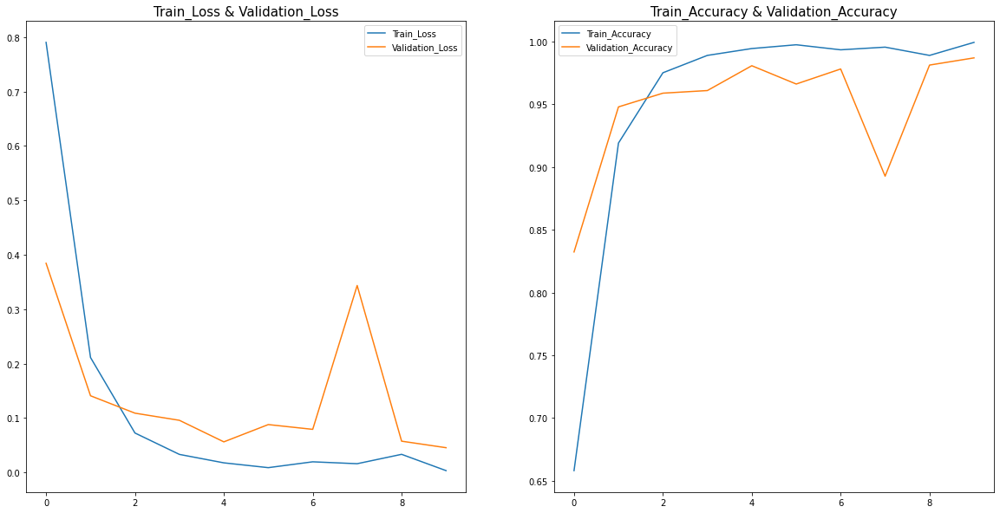

In [23]:
#training and validation loss and accuracy
plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
plt.plot(history['loss'],label='Train_Loss')
plt.plot(history['val_loss'],label='Validation_Loss')
plt.title('Train_Loss & Validation_Loss',fontsize=15)
plt.legend()
plt.subplot(1,2,2)
plt.plot(history['accuracy'],label='Train_Accuracy')
plt.plot(history['val_accuracy'],label='Validation_Accuracy')
plt.title('Train_Accuracy & Validation_Accuracy',fontsize=15)
plt.legend()
plt.show()

In [24]:
# test loss and test accuracy
score, acc= model.evaluate(X_test,y_test)
print('Test Loss =', score)
print('Test Accuracy =', acc)

60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - accuracy: 0.9919 - loss: 0.0301
Test Loss = 0.045341383665800095
Test Accuracy = 0.9880208373069763


In [25]:
#prediction test data
predictions = model.predict(X_test)
y_pred = np.argmax(predictions,axis=1)
y_test_ = np.argmax(y_test,axis=1)
df = pd.DataFrame({'Actual': y_test_, 'Prediction': y_pred})
df

60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step


,Actual,Prediction
0,1,1
1,1,1
2,0,0
3,2,2
4,2,2
...,...,...
1915,2,2
1916,0,0
1917,2,2
1918,3,3


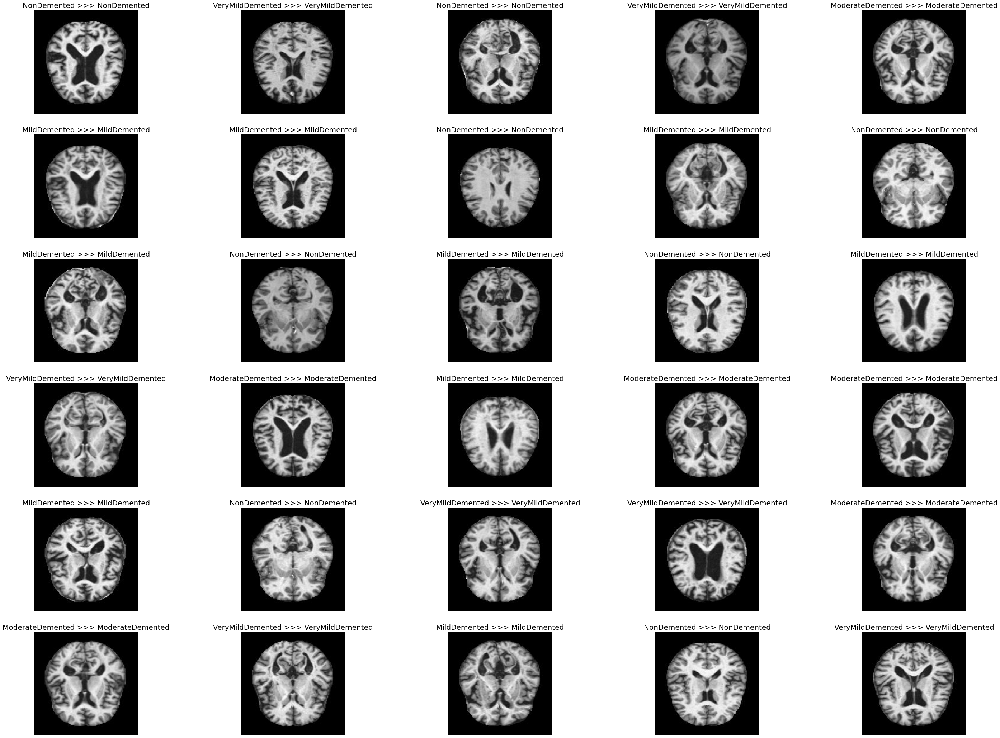

In [26]:
#images showing actual label and presicted label on a random 30 images.
plt.figure(figsize=(50,50))
for x,i in enumerate(np.random.randint(0,len(X_test),30)):
    plt.subplot(8,5,x+1)
    plt.imshow(X_test[i])
    plt.axis('off')
    plt.title(f'{class_num[y_test_[i]]} >>> {class_num[y_pred[i]]}',fontsize=20)

array([[480,   0,   0,   0],
       [  0, 480,   0,   0],
       [  1,   0, 466,  13],
       [  0,   0,   9, 471]], dtype=int64)

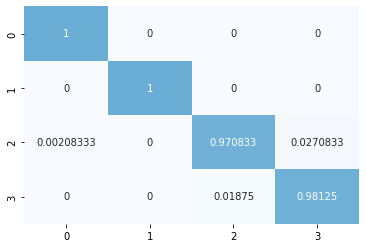

In [27]:
#confusion matrix
CM = confusion_matrix(y_test_,y_pred)
CM_percent = CM.astype('float') / CM.sum(axis=1)[:, np.newaxis]
sns.heatmap(CM_percent,fmt='g',center = True,cbar=False,annot=True,cmap='Blues')
CM

In [28]:
#classification report
ClassificationReport = classification_report(y_test_,y_pred)
print('Classification\nReport', ClassificationReport )

Classification
Report               precision    recall  f1-score   support

           0       1.00      1.00      1.00       480
           1       1.00      1.00      1.00       480
           2       0.98      0.97      0.98       480
           3       0.97      0.98      0.98       480

    accuracy                           0.99      1920
   macro avg       0.99      0.99      0.99      1920
weighted avg       0.99      0.99      0.99      1920



In [29]:
#effecient NETB0
model = EfficientNetB0(
    include_top=True,
    weights=None,
    classes=4,
    input_shape=(176, 176, 3),
)
model.compile(optimizer="adam", loss="categorical_crossentropy", metrics=["accuracy"])

model.summary()

#epochs = 10  # @param {type: "slider", min:10, max:100}
hist=model.fit(X_train,y_train, epochs=4, validation_data=(X_val,y_val))

Model: "efficientnetb0"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 176, 176,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling           │ (None, 176, 176,  │          0 │ input_layer_2[0]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ normalization       │ (None, 176, 176,  │          7 │ rescaling[0][0]   │
│ (Normalization)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv_pad       │ (None, 177, 177,  │          0 │ normalization[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 88, 88,    │        864 │ stem_conv_pad[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 88, 88,    │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, 88, 88,    │          0 │ stem_bn[0][0]     │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_dwconv      │ (None, 88, 88,    │        288 │ stem_activation[… │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_bn          │ (None, 88, 88,    │        128 │ block1a_dwconv[0… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_activation  │ (None, 88, 88,    │          0 │ block1a_bn[0][0]  │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_squeeze  │ (None, 32)        │          0 │ block1a_activati… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reshape  │ (None, 1, 1, 32)  │          0 │ block1a_se_squee… │
│ (Reshape)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reduce   │ (None, 1, 1, 8)   │        264 │ block1a_se_resha… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_expand   │ (None, 1, 1, 32)  │        288 │ block1a_se_reduc… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_excite   │ (None, 88, 88,    │          0 │ block1a_activati… │
│ (Multiply)          │ 32)               │            │ block1a_se_expan… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, 88, 88,    │        512 │ block1a_se_excit… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_bn  │ (None, 88, 88,    │         64 │ block1a_project_

 Total params: 4,054,695 (15.47 MB)

 Trainable params: 4,012,672 (15.31 MB)

 Non-trainable params: 42,023 (164.16 KB)

Epoch 1/4
280/280 ━━━━━━━━━━━━━━━━━━━━ 692s 2s/step - accuracy: 0.4218 - loss: 2.4641 - val_accuracy: 0.2500 - val_loss: 2.0968
Epoch 2/4
280/280 ━━━━━━━━━━━━━━━━━━━━ 639s 2s/step - accuracy: 0.7040 - loss: 0.6238 - val_accuracy: 0.2500 - val_loss: 3.7355
Epoch 3/4
280/280 ━━━━━━━━━━━━━━━━━━━━ 667s 2s/step - accuracy: 0.8505 - loss: 0.3678 - val_accuracy: 0.8240 - val_loss: 0.4241
Epoch 4/4
280/280 ━━━━━━━━━━━━━━━━━━━━ 647s 2s/step - accuracy: 0.9004 - loss: 0.2615 - val_accuracy: 0.8495 - val_loss: 0.3618


In [30]:
#accuracy loss for each epochs
history=pd.DataFrame(hist.history)
history

,accuracy,loss,val_accuracy,val_loss
0,0.512835,1.547587,0.250000,2.096792
1,0.731920,0.584364,0.250000,3.735539
2,0.855580,0.352113,0.823958,0.424051
3,0.907701,0.239698,0.849479,0.361760


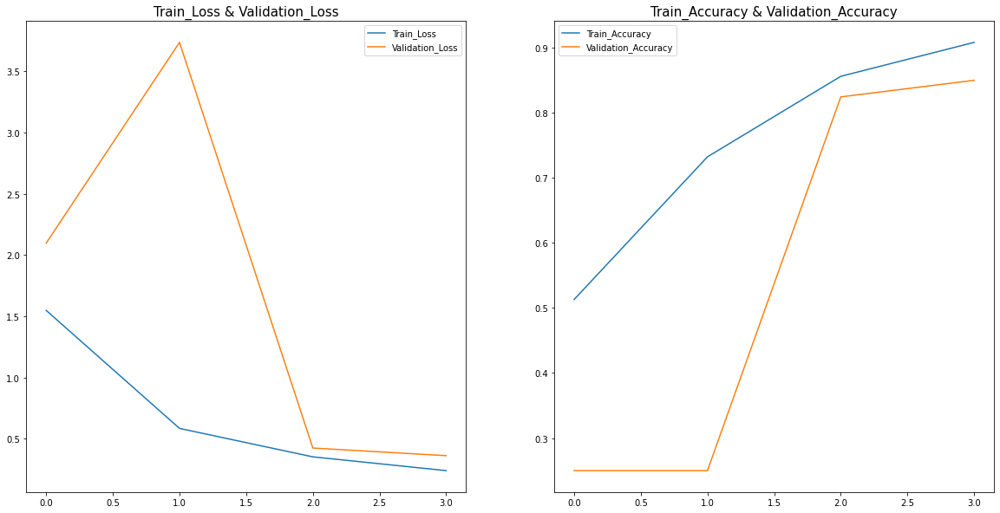

In [31]:
#training and validation loss and accuracy
plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
plt.plot(history['loss'],label='Train_Loss')
plt.plot(history['val_loss'],label='Validation_Loss')
plt.title('Train_Loss & Validation_Loss',fontsize=15)
plt.legend()
plt.subplot(1,2,2)
plt.plot(history['accuracy'],label='Train_Accuracy')
plt.plot(history['val_accuracy'],label='Validation_Accuracy')
plt.title('Train_Accuracy & Validation_Accuracy',fontsize=15)
plt.legend()
plt.show()

In [32]:
# test loss and test accuracy
score, acc= model.evaluate(X_test,y_test)
print('Test Loss =', score)
print('Test Accuracy =', acc)

60/60 ━━━━━━━━━━━━━━━━━━━━ 24s 394ms/step - accuracy: 0.8597 - loss: 0.3426
Test Loss = 0.35337308049201965
Test Accuracy = 0.8588541746139526


In [33]:
#prediction test data
predictions = model.predict(X_test)
y_pred = np.argmax(predictions,axis=1)
y_test_ = np.argmax(y_test,axis=1)
df = pd.DataFrame({'Actual': y_test_, 'Prediction': y_pred})
df

60/60 ━━━━━━━━━━━━━━━━━━━━ 25s 383ms/step


,Actual,Prediction
0,1,1
1,1,1
2,0,0
3,2,2
4,2,3
...,...,...
1915,2,3
1916,0,0
1917,2,2
1918,3,3


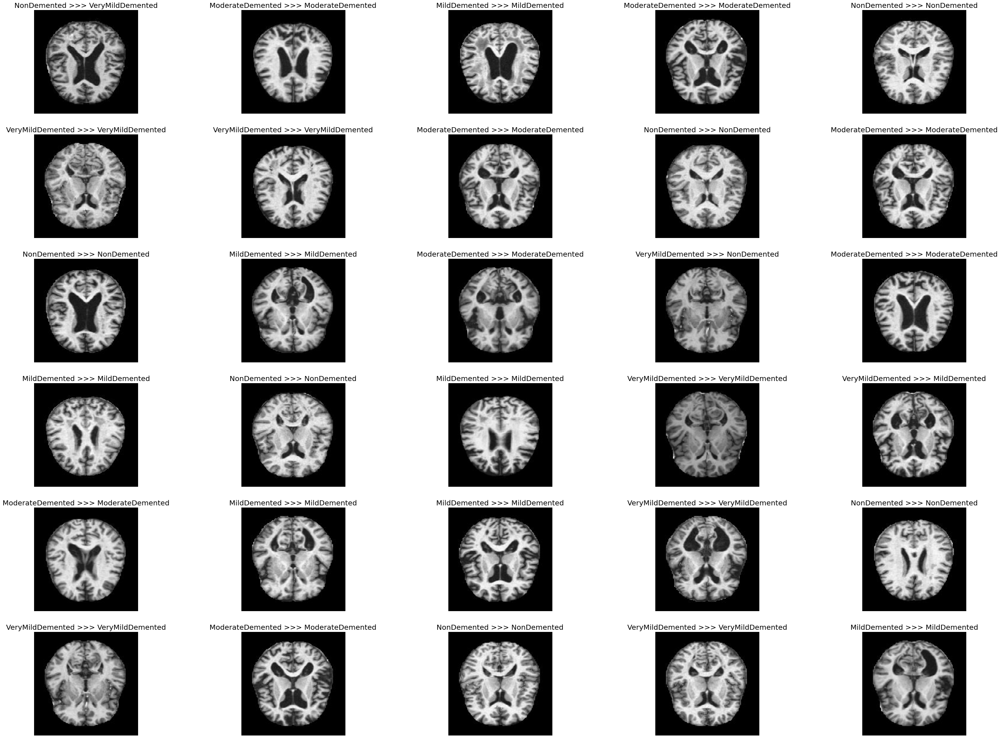

In [34]:
#images showing actual label and presicted label on a random 30 images.
plt.figure(figsize=(50,50))
for x,i in enumerate(np.random.randint(0,len(X_test),30)):
    plt.subplot(8,5,x+1)
    plt.imshow(X_test[i])
    plt.axis('off')
    plt.title(f'{class_num[y_test_[i]]} >>> {class_num[y_pred[i]]}',fontsize=20)

array([[456,   0,   2,  22],
       [  0, 480,   0,   0],
       [ 16,   0, 294, 170],
       [ 47,   0,  14, 419]], dtype=int64)

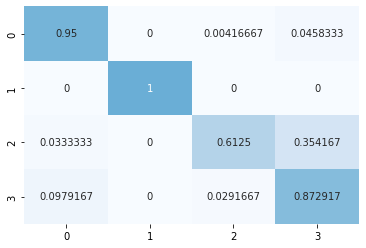

In [35]:
#confusion matrix
CM = confusion_matrix(y_test_,y_pred)
CM_percent = CM.astype('float') / CM.sum(axis=1)[:, np.newaxis]
sns.heatmap(CM_percent,fmt='g',center = True,cbar=False,annot=True,cmap='Blues')
CM

In [36]:
#classification report
ClassificationReport = classification_report(y_test_,y_pred)
print('Classification\nReport', ClassificationReport )

Classification
Report               precision    recall  f1-score   support

           0       0.88      0.95      0.91       480
           1       1.00      1.00      1.00       480
           2       0.95      0.61      0.74       480
           3       0.69      0.87      0.77       480

    accuracy                           0.86      1920
   macro avg       0.88      0.86      0.86      1920
weighted avg       0.88      0.86      0.86      1920



In [55]:
# Without Data Augmentation
X_train, X_test1, y_train, y_test1 = train_test_split(train_data,train_labels, test_size=0.3, random_state=42,shuffle=True,stratify=train_labels)
X_val, X_test, y_val, y_test = train_test_split(X_test1,y_test1, test_size=0.5, random_state=42,shuffle=True,stratify=y_test1)
print('X_train shape:' , X_train.shape)
print('X_test shape:' , X_test.shape)
print('X_val shape:' , X_val.shape)
print('y_train shape:' , y_train.shape)
print('y_test shape:' , y_test.shape)
print('y_val shape:' , y_val.shape)


X_train shape: (4480, 176, 176, 3)
X_test shape: (960, 176, 176, 3)
X_val shape: (960, 176, 176, 3)
y_train shape: (4480, 4)
y_test shape: (960, 4)
y_val shape: (960, 4)


In [38]:
#layers of the CNN
model=keras.models.Sequential()
model.add(keras.layers.Conv2D(32,kernel_size=(3,3),strides=2,padding='same',activation='relu',input_shape=(176,176,3)))
#model.add(keras.layers.MaxPool2D(pool_size=(2,2),strides=2,padding='same'))
model.add(keras.layers.Conv2D(64,kernel_size=(3,3),strides=2,activation='relu',padding='same'))
model.add(keras.layers.MaxPool2D((2,2),2,padding='same'))
model.add(keras.layers.Conv2D(128,kernel_size=(3,3),strides=2,activation='relu',padding='same'))
model.add(keras.layers.MaxPool2D((2,2),2,padding='same'))
model.add(keras.layers.Flatten())
model.add(keras.layers.Dense(1024,activation='relu'))
model.add(keras.layers.Dropout(0.3))
model.add(keras.layers.Dense(4,activation='softmax'))
model.summary()

c:\Users\Shaswat Sinha\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\layers\convolutional\base_conv.py:99: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_5 (Conv2D)               │ (None, 88, 88, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 44, 44, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 22, 22, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 11, 11, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 6, 6, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 4608)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 1024)           │     4,719,616 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 4)              │         4,100 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,816,964 (18.38 MB)

 Trainable params: 4,816,964 (18.38 MB)

 Non-trainable params: 0 (0.00 B)

In [39]:
#Training the model
checkpoint_cb =ModelCheckpoint("model.keras", save_best_only=True)
early_stopping_cb =EarlyStopping(patience=10, restore_best_weights=True)
model.compile(optimizer ='adam', loss='categorical_crossentropy', metrics=['accuracy'])
hist = model.fit(X_train,y_train, epochs=10, validation_data=(X_val,y_val), callbacks=[checkpoint_cb, early_stopping_cb])

Epoch 1/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 18s 115ms/step - accuracy: 0.4928 - loss: 1.0453 - val_accuracy: 0.5906 - val_loss: 0.9046
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 15s 109ms/step - accuracy: 0.5926 - loss: 0.8636 - val_accuracy: 0.5958 - val_loss: 0.8347
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 15s 108ms/step - accuracy: 0.6914 - loss: 0.7112 - val_accuracy: 0.7219 - val_loss: 0.6178
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 15s 108ms/step - accuracy: 0.8130 - loss: 0.4584 - val_accuracy: 0.8385 - val_loss: 0.3913
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 15s 108ms/step - accuracy: 0.9013 - loss: 0.2579 - val_accuracy: 0.9021 - val_loss: 0.2576
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 15s 108ms/step - accuracy: 0.9565 - loss: 0.1310 - val_accuracy: 0.9292 - val_loss: 0.1926
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 15s 107ms/step - accuracy: 0.9874 - loss: 0.0512 - val_accuracy: 0.9062 - val_loss: 0.2445
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 15s 108ms/step - accuracy: 0.9846 - loss: 0

In [40]:
#accuracy loss for each epochs
history=pd.DataFrame(hist.history)
history

,accuracy,loss,val_accuracy,val_loss
0,0.520312,1.001928,0.590625,0.904640
1,0.601116,0.852764,0.595833,0.834661
2,0.702232,0.682073,0.721875,0.617759
3,0.819420,0.439510,0.838542,0.391276
4,0.908482,0.243555,0.902083,0.257602
5,0.960268,0.115764,0.929167,0.192562
6,0.980134,0.064170,0.906250,0.244526
7,0.985045,0.045558,0.952083,0.137398
8,0.987500,0.038079,0.960417,0.146153
9,0.993750,0.019723,0.946875,0.176082


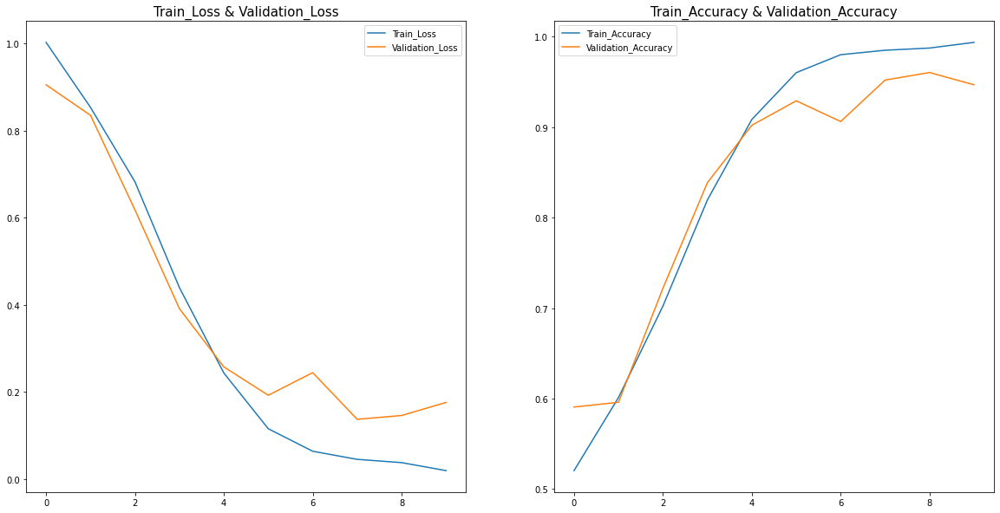

In [41]:
#training and validation loss and accuracy
plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
plt.plot(history['loss'],label='Train_Loss')
plt.plot(history['val_loss'],label='Validation_Loss')
plt.title('Train_Loss & Validation_Loss',fontsize=15)
plt.legend()
plt.subplot(1,2,2)
plt.plot(history['accuracy'],label='Train_Accuracy')
plt.plot(history['val_accuracy'],label='Validation_Accuracy')
plt.title('Train_Accuracy & Validation_Accuracy',fontsize=15)
plt.legend()
plt.show()

In [42]:
# test loss and test accuracy
score, acc= model.evaluate(X_test,y_test)
print('Test Loss =', score)
print('Test Accuracy =', acc)

30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.9602 - loss: 0.1108
Test Loss = 0.12867572903633118
Test Accuracy = 0.9520833492279053


In [43]:
#prediction test data
predictions = model.predict(X_test)
y_pred = np.argmax(predictions,axis=1)
y_test_ = np.argmax(y_test,axis=1)
df = pd.DataFrame({'Actual': y_test_, 'Prediction': y_pred})
df

30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step


,Actual,Prediction
0,2,2
1,3,3
2,0,0
3,3,3
4,1,1
...,...,...
955,3,3
956,2,2
957,0,0
958,3,3


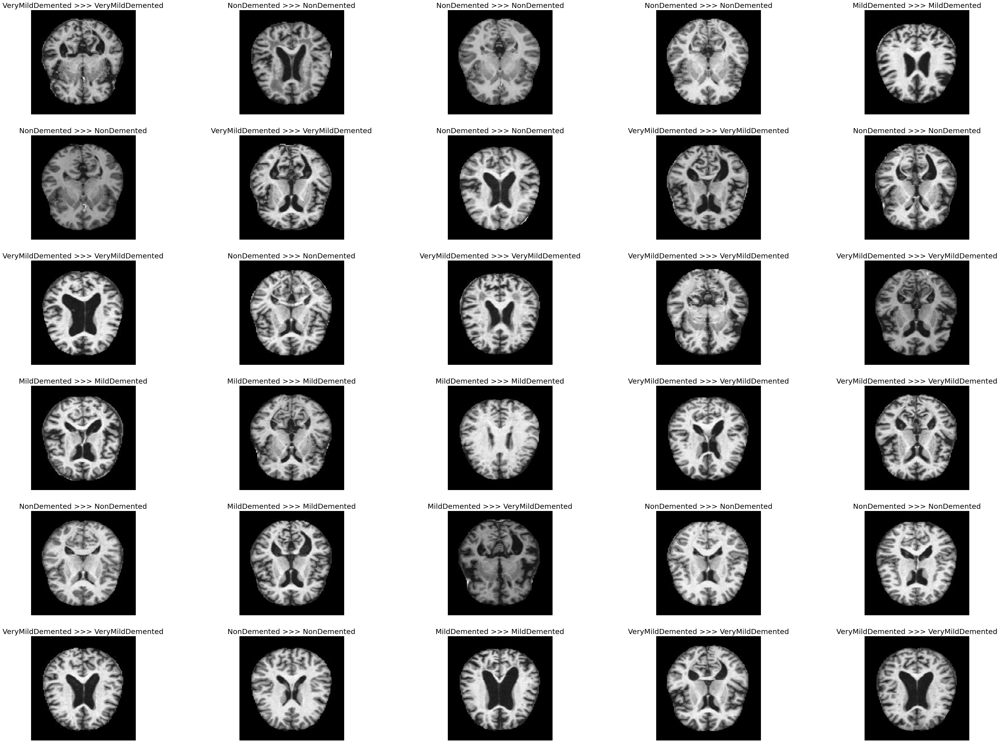

In [44]:
#images showing actual label and presicted label on a random 30 images.
plt.figure(figsize=(50,50))
for x,i in enumerate(np.random.randint(0,len(X_test),30)):
    plt.subplot(8,5,x+1)
    plt.imshow(X_test[i])
    plt.axis('off')
    plt.title(f'{class_num[y_test_[i]]} >>> {class_num[y_pred[i]]}',fontsize=20)

array([[126,   0,   3,   5],
       [  0,   9,   1,   0],
       [  1,   0, 468,  11],
       [  5,   0,  20, 311]], dtype=int64)

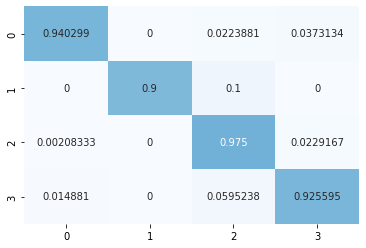

In [45]:
#confusion matrix
CM = confusion_matrix(y_test_,y_pred)
CM_percent = CM.astype('float') / CM.sum(axis=1)[:, np.newaxis]
sns.heatmap(CM_percent,fmt='g',center = True,cbar=False,annot=True,cmap='Blues')
CM

In [46]:
#classification report
ClassificationReport = classification_report(y_test_,y_pred)
print('Classification\nReport', ClassificationReport )

Classification
Report               precision    recall  f1-score   support

           0       0.95      0.94      0.95       134
           1       1.00      0.90      0.95        10
           2       0.95      0.97      0.96       480
           3       0.95      0.93      0.94       336

    accuracy                           0.95       960
   macro avg       0.96      0.94      0.95       960
weighted avg       0.95      0.95      0.95       960



In [65]:
#model 4 basic cnn with 1 layer and without balancing
model=keras.models.Sequential()
model.add(keras.layers.Conv2D(32,kernel_size=(3,3),strides=2,padding='same',activation='relu',input_shape=(176,176,3)))
model.add(keras.layers.Conv2D(64,kernel_size=(3,3),strides=2,activation='relu',padding='same'))
model.add(keras.layers.MaxPool2D((2,2),2,padding='same'))
model.add(keras.layers.Flatten())
model.add(keras.layers.Dense(4,activation='softmax'))
model.summary()


c:\Users\Shaswat Sinha\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\layers\convolutional\base_conv.py:99: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(


Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_10 (Conv2D)              │ (None, 88, 88, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, 44, 44, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 22, 22, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_4 (Flatten)             │ (None, 30976)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 4)              │       123,908 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 143,300 (559.77 KB)

 Trainable params: 143,300 (559.77 KB)

 Non-trainable params: 0 (0.00 B)

In [66]:
checkpoint_cb =ModelCheckpoint("model.keras", save_best_only=True)
early_stopping_cb =EarlyStopping(patience=10, restore_best_weights=True)
model.compile(optimizer ='adam', loss='categorical_crossentropy', metrics=['accuracy'])
hist = model.fit(X_train,y_train, epochs=10, validation_data=(X_val,y_val), callbacks=[checkpoint_cb, early_stopping_cb])

Epoch 1/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 12s 76ms/step - accuracy: 0.4880 - loss: 1.0384 - val_accuracy: 0.5917 - val_loss: 0.8835
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6123 - loss: 0.8327 - val_accuracy: 0.7323 - val_loss: 0.6463
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.7942 - loss: 0.5194 - val_accuracy: 0.8458 - val_loss: 0.4204
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - accuracy: 0.9202 - loss: 0.2450 - val_accuracy: 0.8656 - val_loss: 0.3320
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - accuracy: 0.9591 - loss: 0.1355 - val_accuracy: 0.9260 - val_loss: 0.1915
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step - accuracy: 0.9749 - loss: 0.0952 - val_accuracy: 0.9229 - val_loss: 0.1980
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step - accuracy: 0.9962 - loss: 0.0294 - val_accuracy: 0.9250 - val_loss: 0.2014
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step - accuracy: 0.9997 - loss: 0.0143 - val_ac

In [67]:
#accuracy loss for each epochs
history=pd.DataFrame(hist.history)
history

,accuracy,loss,val_accuracy,val_loss
0,0.514286,0.984984,0.591667,0.883480
1,0.654241,0.768129,0.732292,0.646259
2,0.816295,0.467903,0.845833,0.420374
3,0.920089,0.234274,0.865625,0.332019
4,0.959152,0.130508,0.926042,0.191484
5,0.978348,0.081276,0.922917,0.198031
6,0.995759,0.026523,0.925000,0.201355
7,0.999777,0.011590,0.957292,0.112512
8,1.000000,0.006117,0.963542,0.107464
9,1.000000,0.004248,0.970833,0.087146


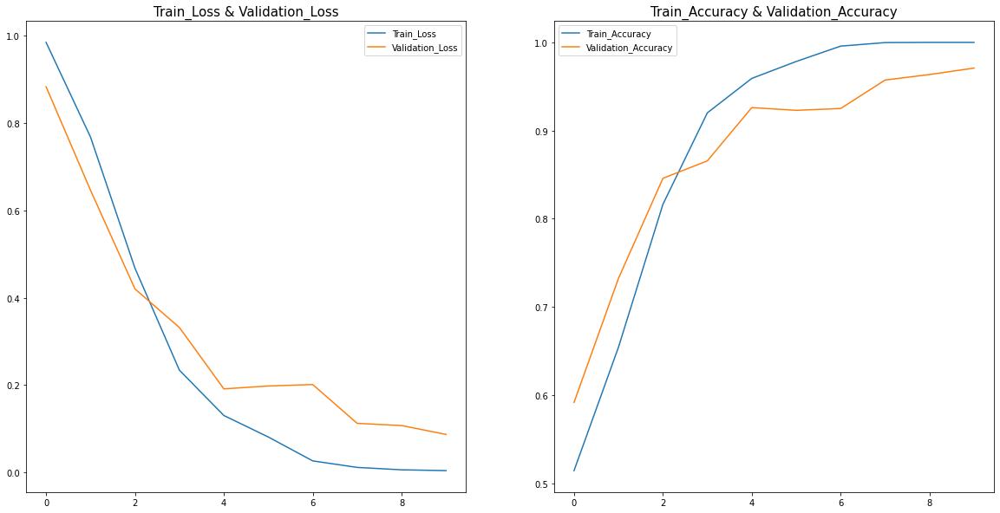

In [68]:
#training and validation loss and accuracy
plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
plt.plot(history['loss'],label='Train_Loss')
plt.plot(history['val_loss'],label='Validation_Loss')
plt.title('Train_Loss & Validation_Loss',fontsize=15)
plt.legend()
plt.subplot(1,2,2)
plt.plot(history['accuracy'],label='Train_Accuracy')
plt.plot(history['val_accuracy'],label='Validation_Accuracy')
plt.title('Train_Accuracy & Validation_Accuracy',fontsize=15)
plt.legend()
plt.show()

In [69]:
# test loss and test accuracy
score, acc= model.evaluate(X_test,y_test)
print('Test Loss =', score)
print('Test Accuracy =', acc)

30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.9762 - loss: 0.0872
Test Loss = 0.09111084043979645
Test Accuracy = 0.9750000238418579


In [70]:
#prediction test data
predictions = model.predict(X_test)
y_pred = np.argmax(predictions,axis=1)
y_test_ = np.argmax(y_test,axis=1)
df = pd.DataFrame({'Actual': y_test_, 'Prediction': y_pred})
df

30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step


,Actual,Prediction
0,2,2
1,3,3
2,0,0
3,3,3
4,1,1
...,...,...
955,3,3
956,2,2
957,0,0
958,3,3


array([[130,   0,   3,   1],
       [  0,  10,   0,   0],
       [  1,   0, 472,   7],
       [  1,   0,  11, 324]], dtype=int64)

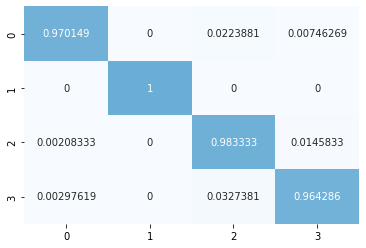

In [71]:
#confusion matrix
CM = confusion_matrix(y_test_,y_pred)
CM_percent = CM.astype('float') / CM.sum(axis=1)[:, np.newaxis]
sns.heatmap(CM_percent,fmt='g',center = True,cbar=False,annot=True,cmap='Blues')
CM

In [53]:
ClassificationReport = classification_report(y_test_,y_pred)
print('Classification\nReport', ClassificationReport )

Classification
Report               precision    recall  f1-score   support

           0       0.99      0.96      0.98       134
           1       1.00      1.00      1.00        10
           2       0.97      0.98      0.98       480
           3       0.96      0.96      0.96       336

    accuracy                           0.97       960
   macro avg       0.98      0.98      0.98       960
weighted avg       0.97      0.97      0.97       960



In [75]:
from keras.applications import EfficientNetB0

In [56]:
#effecient NETB0
model = EfficientNetB0(
    include_top=True,
    weights=None,
    classes=4,
    input_shape=(176, 176, 3),
)
model.compile(optimizer="adam", loss="categorical_crossentropy", metrics=["accuracy"])

model.summary()

#epochs = 10  # @param {type: "slider", min:10, max:100}
hist=model.fit(X_train,y_train, epochs=4, validation_data=(X_val,y_val))#, callbacks=[checkpoint_cb, early_stopping_cb])

Model: "efficientnetb0"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_5       │ (None, 176, 176,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_1         │ (None, 176, 176,  │          0 │ input_layer_5[0]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ normalization_1     │ (None, 176, 176,  │          7 │ rescaling_1[0][0] │
│ (Normalization)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv_pad       │ (None, 177, 177,  │          0 │ normalization_1[… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 88, 88,    │        864 │ stem_conv_pad[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 88, 88,    │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, 88, 88,    │          0 │ stem_bn[0][0]     │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_dwconv      │ (None, 88, 88,    │        288 │ stem_activation[… │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_bn          │ (None, 88, 88,    │        128 │ block1a_dwconv[0… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_activation  │ (None, 88, 88,    │          0 │ block1a_bn[0][0]  │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_squeeze  │ (None, 32)        │          0 │ block1a_activati… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reshape  │ (None, 1, 1, 32)  │          0 │ block1a_se_squee… │
│ (Reshape)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reduce   │ (None, 1, 1, 8)   │        264 │ block1a_se_resha… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_expand   │ (None, 1, 1, 32)  │        288 │ block1a_se_reduc… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_excite   │ (None, 88, 88,    │          0 │ block1a_activati… │
│ (Multiply)          │ 32)               │            │ block1a_se_expan… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, 88, 88,    │        512 │ block1a_se_excit… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_bn  │ (None, 88, 88,    │         64 │ block1a_project_

 Total params: 4,054,695 (15.47 MB)

 Trainable params: 4,012,672 (15.31 MB)

 Non-trainable params: 42,023 (164.16 KB)

Epoch 1/4
140/140 ━━━━━━━━━━━━━━━━━━━━ 378s 2s/step - accuracy: 0.3946 - loss: 3.1942 - val_accuracy: 0.3500 - val_loss: 1.2939
Epoch 2/4
140/140 ━━━━━━━━━━━━━━━━━━━━ 340s 2s/step - accuracy: 0.4897 - loss: 1.2833 - val_accuracy: 0.3500 - val_loss: 1.0806
Epoch 3/4
140/140 ━━━━━━━━━━━━━━━━━━━━ 339s 2s/step - accuracy: 0.5427 - loss: 1.1138 - val_accuracy: 0.5000 - val_loss: 1.2529
Epoch 4/4
140/140 ━━━━━━━━━━━━━━━━━━━━ 340s 2s/step - accuracy: 0.5842 - loss: 0.9681 - val_accuracy: 0.5167 - val_loss: 1.0384


In [58]:
history=pd.DataFrame(hist.history)
history

,accuracy,loss,val_accuracy,val_loss
0,0.437500,2.098581,0.350000,1.293862
1,0.505134,1.208287,0.350000,1.080622
2,0.550893,1.067349,0.500000,1.252855
3,0.621875,0.876857,0.516667,1.038355


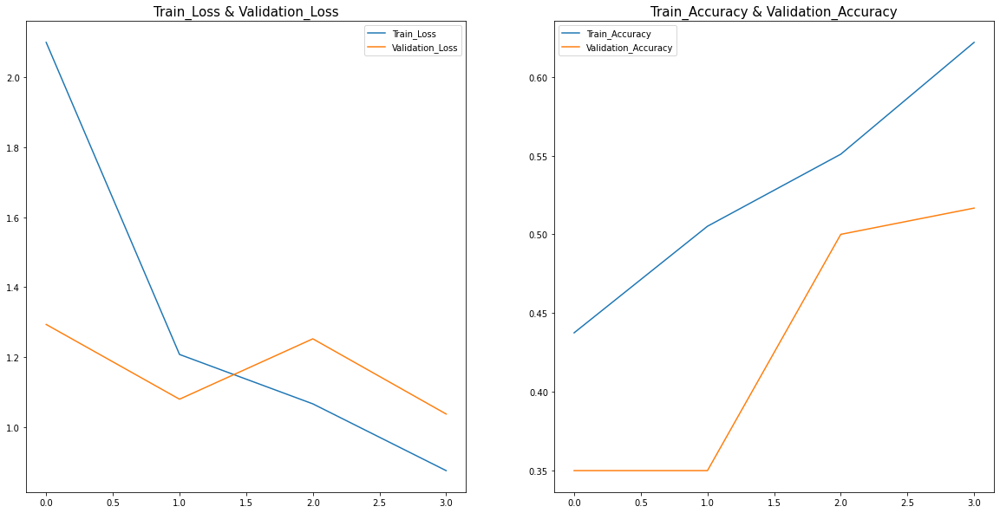

In [59]:
#training and validation loss and accuracy
plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
plt.plot(history['loss'],label='Train_Loss')
plt.plot(history['val_loss'],label='Validation_Loss')
plt.title('Train_Loss & Validation_Loss',fontsize=15)
plt.legend()
plt.subplot(1,2,2)
plt.plot(history['accuracy'],label='Train_Accuracy')
plt.plot(history['val_accuracy'],label='Validation_Accuracy')
plt.title('Train_Accuracy & Validation_Accuracy',fontsize=15)
plt.legend()
plt.show()

In [60]:
# test loss and test accuracy
score, acc= model.evaluate(X_test,y_test)
print('Test Loss =', score)
print('Test Accuracy =', acc)

30/30 ━━━━━━━━━━━━━━━━━━━━ 13s 419ms/step - accuracy: 0.4684 - loss: 1.0883
Test Loss = 1.0537796020507812
Test Accuracy = 0.4885416626930237


In [62]:
#prediction test data
predictions = model.predict(X_test)
y_pred = np.argmax(predictions,axis=1)
y_test_ = np.argmax(y_test,axis=1)
df = pd.DataFrame({'Actual': y_test_, 'Prediction': y_pred})
df

30/30 ━━━━━━━━━━━━━━━━━━━━ 13s 426ms/step


,Actual,Prediction
0,2,2
1,3,3
2,0,3
3,3,2
4,1,2
...,...,...
955,3,3
956,2,2
957,0,3
958,3,2


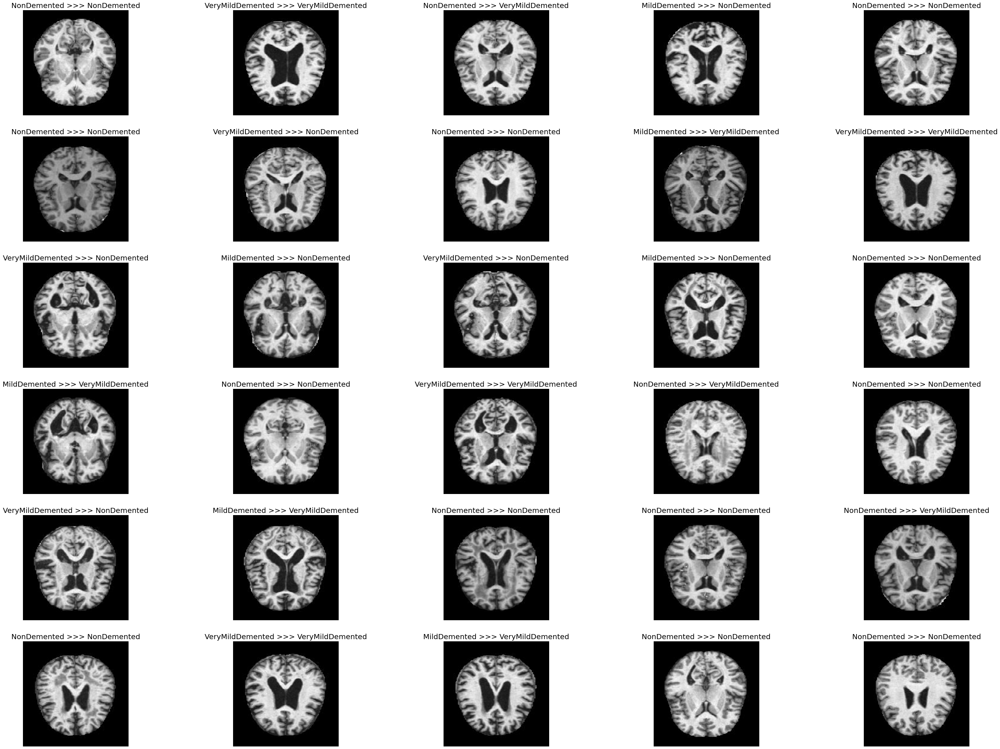

In [63]:
#images showing actual label and presicted label on a random 30 images.
plt.figure(figsize=(50,50))
for x,i in enumerate(np.random.randint(0,len(X_test),30)):
    plt.subplot(8,5,x+1)
    plt.imshow(X_test[i])
    plt.axis('off')
    plt.title(f'{class_num[y_test_[i]]} >>> {class_num[y_pred[i]]}',fontsize=20)

In [64]:
ClassificationReport = classification_report(y_test_,y_pred)
print('Classification\nReport', ClassificationReport )

Classification
Report               precision    recall  f1-score   support

           0       0.00      0.00      0.00       134
           1       0.00      0.00      0.00        10
           2       0.55      0.77      0.64       480
           3       0.35      0.30      0.32       336

    accuracy                           0.49       960
   macro avg       0.22      0.27      0.24       960
weighted avg       0.40      0.49      0.43       960



c:\Users\Shaswat Sinha\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Shaswat Sinha\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Shaswat Sinha\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi